In [2]:
import json
import os

import anndata
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import multiplex_imaging_pipeline.utils as utils

In [6]:
case = 'HT413C1-Th1k4A1'
output_dir = f'/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/{case}'
spatial_dir = os.path.join(output_dir, 'spatial_features')

In [7]:
fps = sorted(utils.listfiles(spatial_dir, '.txt$'))
fps

['/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U10_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U20_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U26_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U32_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U37_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U3_spatial_features.txt',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spat

In [8]:
df = pd.read_csv(
    '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U10_spatial_features.txt',
    sep='\t', index_col=0
)
df

,row,col,bbox-r1,bbox-c1,bbox-r2,bbox-c2,area,CCL2_fraction,CCL2_intensity,CCL2_intensity_scaled,...,Podoplanin_fraction,Podoplanin_intensity,Podoplanin_intensity_scaled,SMA_fraction,SMA_intensity,SMA_intensity_scaled,SOX9_fraction,SOX9_intensity,SOX9_intensity_scaled,cell_type
label,,,,,,,,,,,,,,,,,,,,,
1,6.019088,285.426299,0,235,16,320,943.0,0.601273,0.692471,0.041758,...,0.054083,0.062566,0.010126,0.0,0.007423,0.000138,0.047720,0.050901,0.005154,Stroma
2,7.552529,861.425681,0,809,18,900,1285.0,0.583658,0.659144,0.039749,...,0.063813,0.071595,0.011588,0.0,0.010117,0.000188,0.051362,0.056809,0.005752,Stroma
3,6.319283,7197.589041,0,7150,16,7231,949.0,0.771338,0.990516,0.059732,...,0.049526,0.054795,0.008869,0.0,0.275026,0.005121,0.102213,0.108535,0.010990,Unlabeled
4,5.430857,7383.262857,0,7335,14,7420,875.0,0.677714,0.779429,0.047002,...,0.050286,0.053714,0.008694,0.0,0.222857,0.004149,0.092571,0.104000,0.010530,Stroma
5,6.415686,7587.012745,0,7535,17,7622,1020.0,0.653922,0.765686,0.046174,...,0.058824,0.064706,0.010473,0.0,0.199020,0.003705,0.098039,0.110784,0.011217,Stroma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58761,6729.205714,6145.905714,6720,6135,6741,6160,350.0,0.865714,21.820000,1.315823,...,0.777143,3.705714,0.599778,0.0,6.037143,0.112403,0.742857,4.242857,0.429608,Epithelial
58762,6750.515455,6213.800515,6721,6159,6769,6280,3494.0,0.903263,3.153692,0.190179,...,0.163423,0.324556,0.052530,0.0,1.017172,0.018938,0.197195,0.512021,0.051844,Stroma
58763,6741.246479,6155.348592,6731,6143,6754,6166,284.0,0.996479,13.102113,0.790103,...,0.500000,1.383803,0.223972,0.0,3.429577,0.063854,0.482394,1.676056,0.169708,Epithelial


(-129.38524277925086,
 8140.933994294888,
 7342.947701612903,
 -348.75173387096777)

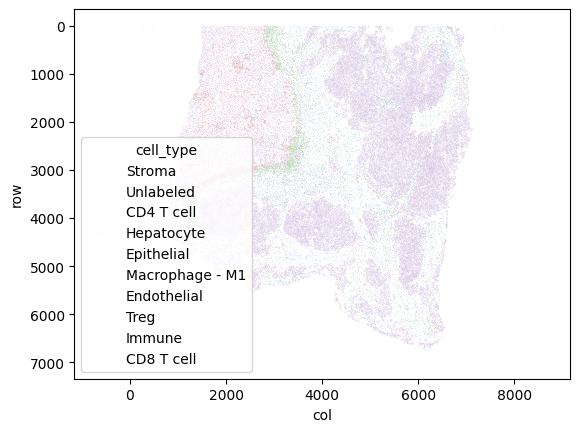

In [9]:
sns.scatterplot(df, x='col', y='row', hue='cell_type', s=.1)
plt.gca().invert_yaxis()
plt.axis('equal')

In [10]:
fps = sorted(utils.listfiles(spatial_dir, '.h5ad$'))
fps

['/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U10_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U20_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U26_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U32_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U37_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A1/spatial_features/HT413C1_Th1k4A1_U3_spatial_features.h5ad',
 '/diskmnt/Projects/Users/estorrs/imaging-analysis/results/serial_sections/HT413C1-Th1k4A

In [11]:
channel_thresholds = json.load(open(os.path.join(output_dir, 'channel_thresholds.json')))
specimen_to_thresholds = {k.split(' | ')[-1].split('__')[0]:v for k, v in channel_thresholds.items()} # fps should be unique
specimen_to_thresholds.keys(), next(iter(specimen_to_thresholds.values()))

(dict_keys(['HT413C1_Th1k4A1_U20', 'HT413C1_Th1k4A1_U32', 'HT413C1_Th1k4A1_U3', 'HT413C1_Th1k4A1_U41', 'HT413C1_Th1k4A1_U10', 'HT413C1_Th1k4A1_U26', 'HT413C1_Th1k4A1_U37', 'HT413C1_Th1k4A1_U42']),
 [0.0,
  0.0,
  19.0,
  99.0,
  10.0,
  19.0,
  99.0,
  0.0,
  40.0,
  0.0,
  0.0,
  10.0,
  0.0,
  20.0,
  0.0,
  10.0,
  0.0,
  0.0,
  100.0,
  0.0,
  149.0,
  60.0,
  0.0,
  29.0,
  0.0,
  19.0,
  0.0])

In [33]:
channels = utils.get_ome_tiff_channels('/diskmnt/primary/CODEX/HTAN/20240110_Human_mCRC_Serial_section_HT413C1_Th1k4A1_Slide3/HT413C1_Th1k4A1_U32__20240110.ome.tiff')
channels = [utils.R_CHANNEL_MAPPING[c] for c in channels]
vals = specimen_to_thresholds['HT413C1_Th1k4A1_U32']
channels = [c for c, v in zip(channels, vals) if v > 0]
channels

['Pan-Cytokeratin',
 'HLA-DR',
 'CD8',
 'SMA',
 'CD45',
 'Hep-Par-1',
 'CD31',
 'E-cadherin',
 'CD11b',
 'FOXP3',
 'CK7',
 'CD68',
 'CD4',
 'CD3e']

In [34]:
# only use marker channels with fractions set
sid_to_adata = {fp.split('/')[-1].replace('_spatial_features.h5ad', ''):sc.read_h5ad(fp)
               for fp in fps}
sid_to_adata.keys()

dict_keys(['HT413C1_Th1k4A1_U10', 'HT413C1_Th1k4A1_U20', 'HT413C1_Th1k4A1_U26', 'HT413C1_Th1k4A1_U32', 'HT413C1_Th1k4A1_U37', 'HT413C1_Th1k4A1_U3', 'HT413C1_Th1k4A1_U41', 'HT413C1_Th1k4A1_U42'])

In [35]:
combined = None
for sid, adata in sid_to_adata.items():
    adata.obs.index = [f'{sid}_{x}' for x in adata.obs.index]
    adata.obs.index.name = 'label'
    adata = adata[:, channels]
    adata.obs['sample_id'] = sid
    
    if combined is None:
        combined = adata
    else:
        combined = anndata.concat([combined, adata])
combined

/diskmnt/Projects/Users/estorrs/sandbox/tmp/ipykernel_63250/517964490.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample_id'] = sid
/diskmnt/Projects/Users/estorrs/sandbox/tmp/ipykernel_63250/517964490.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample_id'] = sid
/diskmnt/Projects/Users/estorrs/sandbox/tmp/ipykernel_63250/517964490.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample_id'] = sid
/diskmnt/Projects/Users/estorrs/sandbox/tmp/ipykernel_63250/517964490.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['sample_id'] = sid
/diskmnt/Projects/Users/estorrs/sandbox/tmp/ipykernel_63250/517964490.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as

AnnData object with n_obs × n_vars = 481021 × 14
    obs: 'row', 'col', 'bbox-r1', 'bbox-c1', 'bbox-r2', 'bbox-c2', 'area', 'CCL2_intensity', 'CCL2_intensity_scaled', 'CD11b_intensity', 'CD11b_intensity_scaled', 'CD20_intensity', 'CD20_intensity_scaled', 'CD31_intensity', 'CD31_intensity_scaled', 'CD3e_intensity', 'CD3e_intensity_scaled', 'CD45_intensity', 'CD45_intensity_scaled', 'CD4_intensity', 'CD4_intensity_scaled', 'CD68_intensity', 'CD68_intensity_scaled', 'CD8_intensity', 'CD8_intensity_scaled', 'CK14_intensity', 'CK14_intensity_scaled', 'CK7_intensity', 'CK7_intensity_scaled', 'CK8/18_intensity', 'CK8/18_intensity_scaled', 'DAPI_intensity', 'DAPI_intensity_scaled', 'E-cadherin_intensity', 'E-cadherin_intensity_scaled', 'FOXP3_intensity', 'FOXP3_intensity_scaled', 'GLUT1_intensity', 'GLUT1_intensity_scaled', 'HLA-DR_intensity', 'HLA-DR_intensity_scaled', 'Hep-Par-1_intensity', 'Hep-Par-1_intensity_scaled', 'Ki67_intensity', 'Ki67_intensity_scaled', 'MUC2_intensity', 'MUC2_inten

In [36]:
combined.var.index

Index(['Pan-Cytokeratin', 'HLA-DR', 'CD8', 'SMA', 'CD45', 'Hep-Par-1', 'CD31',
       'E-cadherin', 'CD11b', 'FOXP3', 'CK7', 'CD68', 'CD4', 'CD3e'],
      dtype='object')

In [37]:
%%time
sc.pp.neighbors(combined, use_rep='X')

CPU times: user 10min 17s, sys: 8min 43s, total: 19min
Wall time: 1min 7s


In [38]:
import umap

In [39]:
model = umap.UMAP(
    n_neighbors=15,
    n_components=2
)
combined.obsm['X_umap'] = model.fit_transform(combined.X)

In [16]:
%%time
sc.tl.umap(combined)

CPU times: user 16h 13min 3s, sys: 9h 34min 6s, total: 1d 1h 47min 10s
Wall time: 38min 38s


In [17]:
%%time 
sc.tl.leiden(combined)

CPU times: user 32min 38s, sys: 36.8 s, total: 33min 15s
Wall time: 32min 58s


/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/diskmnt/Projects/Users/estorrs/miniconda3/envs/imaging_analysis_v2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set

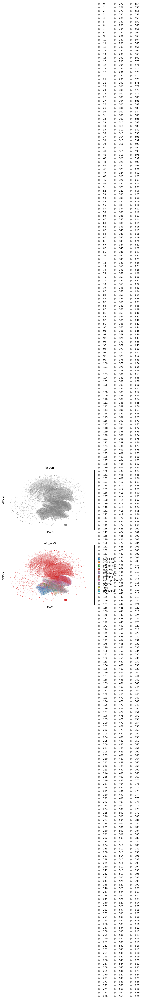

In [18]:
sc.pl.umap(combined, color=['leiden', 'cell_type'], ncols=1)

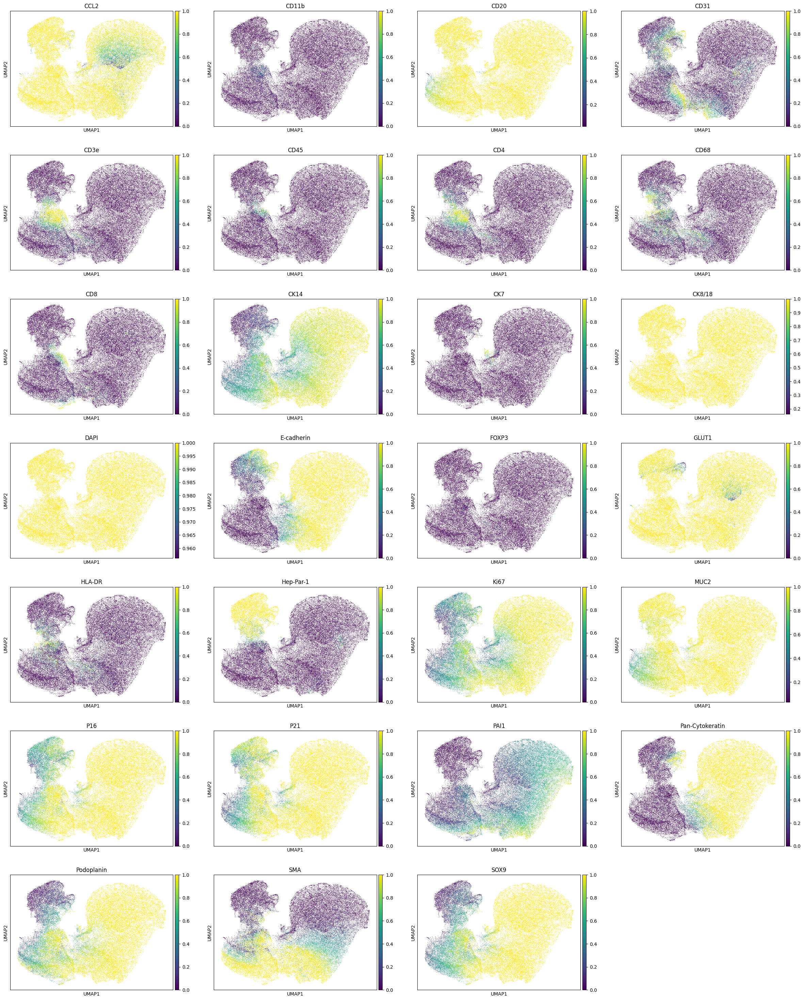

In [24]:
sc.pl.umap(adata, color=adata.var.index.to_list(), ncols=4)